# ANOVOS - Geospatial Analyzer
Following notebook shows the list of functions related to "geospatial analyzer" module provided under ANOVOS package and how it can be invoked accordingly.
- [Stats Gen Lat Long Geo](#Stats-Gen-Lat-Long-Geo)
- [Geo Cluster Generator](#Geo-Cluster-Generator)
- [Generate Loc Charts Controller](#Generate-Loc-Charts-Controller)
- [Geospatial Autodetection](#Geospatial-Autodetection)

**Setting Spark Session**

In [1]:
#set run type variable
run_type = "local" # "local", "emr", "databricks", "ak8s"

In [3]:
#For run_type Azure Kubernetes, run the following block 
import os
from pyspark import SparkContext, SparkConf
from pyspark.sql import SparkSession

if run_type == "ak8s":
    fs_path="<insert conf spark.hadoop.fs master url here> ex: spark.hadoop.fs.azure.sas.<container>.<account_name>.blob.core.windows.net"
    auth_key="<insert value of sas_token here>"
    master_url="<insert kubernetes master url path here> ex: k8s://"
    docker_image="<insert name docker image here>"
    kubernetes_namespace ="<insert kubernetes namespace here>"

    # Create Spark config for our Kubernetes based cluster manager
    sparkConf = SparkConf()
    sparkConf.setMaster(master_url)
    sparkConf.setAppName("Anovos_pipeline")
    sparkConf.set("spark.submit.deployMode","client")
    sparkConf.set("spark.kubernetes.container.image", docker_image)
    sparkConf.set("spark.kubernetes.namespace", kubernetes_namespace)
    sparkConf.set("spark.executor.instances", "4")
    sparkConf.set("spark.executor.cores", "4")
    sparkConf.set("spark.executor.memory", "16g")
    sparkConf.set("spark.kubernetes.pyspark.pythonVersion", "3")
    sparkConf.set("spark.kubernetes.authenticate.driver.serviceAccountName", "spark")
    sparkConf.set(fs_path,auth_key)
    sparkConf.set("spark.kubernetes.authenticate.serviceAccountName", "spark")
    sparkConf.set("spark.jars.packages", "org.apache.hadoop:hadoop-azure:3.2.0,com.microsoft.azure:azure-storage:8.6.3,io.github.histogrammar:histogrammar_2.12:1.0.20,io.github.histogrammar:histogrammar-sparksql_2.12:1.0.20,org.apache.spark:spark-avro_2.12:3.2.1")

    # Initialize our Spark cluster, this will actually
    # generate the worker nodes.
    spark = SparkSession.builder.config(conf=sparkConf).getOrCreate()
    sc = spark.sparkContext

#For other run types import from anovos.shared.
else:
    from anovos.shared.spark import *
    auth_key = "NA"

In [4]:
sc.setLogLevel("ERROR")
import warnings
warnings.filterwarnings('ignore')
import pandas as pd

**Input/Output Path**

In [5]:
inputPath = "../data/income_dataset/csv"
outputPath = "../output/income_dataset/data_analyzer"

In [6]:
from anovos.data_ingest.data_ingest import read_dataset

In [7]:
df = read_dataset(spark, file_path = inputPath, file_type = "csv",file_configs = {"header": "True", 
                                                                           "delimiter": "," , 
                                                                           "inferSchema": "True"})
df = df.drop("dt_1", "dt_2")
df.toPandas().head(5)

,ifa,age,workclass,fnlwgt,logfnl,empty,education,education-num,marital-status,occupation,...,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income,latitude,longitude,geohash
0,1a,NaN,State-gov,77516.0,4.889391,None,Bachelors,13.0,Never-married,Adm-clerical,...,White,Male,2174.0,0.0,40.0,UnitedStates,<=50K,-38.624096,177.982468,rb68np99
1,2a,NaN,Self-emp-not-inc,83311.0,4.920702,None,Bachelors,13.0,Married-civ-spouse,Exec-managerial,...,White,Male,0.0,0.0,13.0,UnitedStates,<=50K,-40.880497,174.992142,rckjypw0
2,3a,38.0,Private,215646.0,5.333741,None,HS-grad,9.0,Divorced,Handlers-cleaners,...,White,Male,0.0,0.0,40.0,UnitedStates,<=50K,-37.735630,176.164047,rckm712q
3,4a,53.0,Private,234721.0,5.370552,None,11th,7.0,Married-civ-spouse,Handlers-cleaners,...,Black,Male,0.0,0.0,40.0,UnitedStates,<=50K,-39.536491,176.832321,rckndgte
4,5a,NaN,Private,338409.0,5.529442,None,Bachelors,13.0,Married-civ-spouse,Prof-specialty,...,Black,Female,0.0,0.0,40.0,Cuba,<=50K,-41.128094,175.033722,rckq4596


# Stats Gen Lat Long Geo

In [8]:
from anovos.data_analyzer.geospatial_analyzer import stats_gen_lat_long_geo

In [9]:
top_geo_records=100

In [10]:
# Example 1 - only passing 1 lat-long pairs
stats_gen_lat_long_geo(df, lat_col = ["latitude"], long_col = ["longitude"], geohash_col = [], id_col = "ifa", master_path = outputPath, max_val = top_geo_records)

If latitude and longitude columns are provided, 2 files will be generated for each pair:
- Overall_Summary_1_latitude_longitude
- Top_100_Lat_long_1_latitude_longitude (max_val = 100)

In [11]:
# Two files for latitude-longitude pairs will be generated inside master_path
odf_summary_latlon = pd.read_csv(outputPath+"/Overall_Summary_1_latitude_longitude.csv")
odf_summary_latlon.head()

,Stats,Count
0,"Distinct {Lat, Long} Pair",32560
1,Distinct Latitude,23587
2,Distinct Longitude,18903
3,"Most Common {Lat, Long} Pair","[-39.603405,176.92099]"
4,"Most Common {Lat, Long} Pair Occurence",2


In [12]:
odf_top_lat_long = pd.read_csv(outputPath+"/Top_{}_Lat_Long_1_latitude_longitude.csv".format(top_geo_records))
odf_top_lat_long

,lat_long_pair,count_id,count_records
0,"[-39.603405,176.92099]",2,2
1,"[-39.03744889,174.1242676]",1,1
2,"[-36.97213364,174.787796]",1,1
3,"[-37.81251908,175.3362274]",1,1
4,"[-36.41827775,174.7210999]",1,1
...,...,...,...
95,"[-44.41278077,171.2628632]",1,1
96,"[-37.72359086,175.2444763]",1,1
97,"[-43.54907609,172.6348267]",1,1
98,"[-40.8855362,175.0231171]",1,1


In [13]:
# Example 2 - only passing 1 geohash column
stats_gen_lat_long_geo(df, lat_col = [], long_col = [], geohash_col = ["geohash"], id_col = "ifa", master_path = outputPath, max_val = top_geo_records)

If geohash columns are prvided, 2 files will be generated for each geohash column:
- Overall_Summary_2_geohash
- Top_100_Geohas_Distribution_2_geohash (max_val = 100)

In [14]:
# Two files for latitude-longitude pairs will be generated inside master_path
odf_summary_geohash = pd.read_csv(outputPath+"/Overall_Summary_2_geohash.csv")
odf_summary_geohash.head()

,Stats,Count
0,Total number of Distinct Geohashes,3558
1,The Precision level observed for the Geohashes,8 [Reference Area Width x Height : 38.2m x 19m]
2,The Most Common Geohash,"rcjhr3d3 , 23"


In [15]:
odf_top_geohash = pd.read_csv(outputPath+"/Top_{}_Geohash_Distribution_2_geohash.csv".format(top_geo_records))
odf_top_geohash

,geohash_8,count_id,count_records
0,rcjhr3d3,23,23
1,pzbpcp9t,21,21
2,rcknp55g,21,21
3,rcs4svcr,18,18
4,rckm7kk7,18,18
...,...,...,...
95,rb68rcm3,15,15
96,rbsmegj5,15,15
97,rckq2buh,15,15
98,rbszj4kz,15,15


In [16]:
# Example 3 - latitude, longitude, geohash columns are all specified
stats_gen_lat_long_geo(df, lat_col = ["latitude"], long_col = ["longitude"], geohash_col = ["geohash"], id_col = "ifa", master_path = outputPath, max_val = top_geo_records)

(None, None)

Since latitude, longitude and geohash columns are provided, 4 files will be generated:
- Overall_Summary_1_latitude_longitude
- Overall_Summary_2_geohash
- Top_100_Lat_long_1_latitude_longitude (max_val = 100)
- Top_100_Geohas_Distribution_2_geohash (max_val = 100)

# Geo Cluster Generator

In [17]:
from anovos.data_analyzer.geospatial_analyzer import geo_cluster_generator

In [19]:
max_cluster = 20
eps = "0.3,0.5,0.05"
min_samples = "500,1100,100"
global_map_box_val = 0
max_records = 100000

In [20]:
# Example 1 - only passing 1 lat-long pairs
geo_cluster_generator(df,["latitude"], ["longitude"], [], max_cluster, eps, min_samples, 
                      outputPath, global_map_box_val, max_records)

For each lat-long pair, 8 figures will be generated:
- cluster_plot_1_elbow_latitude_longitude
- cluster_plot_1_silouhette_latitude_longitude
- cluster_plot_2_dbscan_latitude_longitude
- cluster_plot_2_kmeans_latitude_longitude
- cluster_plot_3_dbscan_latitude_longitude
- cluster_plot_3_kmeans_latitude_longitude
- cluster_plot_4_dbscan_1_latitude_longitude
- cluster_plot_4_dbscan_2_latitude_longitude

In [21]:
import plotly

In [22]:
plotly.io.read_json(outputPath+"/cluster_plot_1_elbow_latitude_longitude")

In [23]:
plotly.io.read_json(outputPath+"/cluster_plot_1_silhoutte_latitude_longitude")

In [24]:
plotly.io.read_json(outputPath+"/cluster_plot_2_kmeans_latitude_longitude")

In [25]:
plotly.io.read_json(outputPath+"/cluster_plot_2_dbscan_latitude_longitude")

In [26]:
plotly.io.read_json(outputPath+"/cluster_plot_3_kmeans_latitude_longitude")

In [27]:
plotly.io.read_json(outputPath+"/cluster_plot_3_dbscan_latitude_longitude")

In [28]:
plotly.io.read_json(outputPath+"/cluster_plot_4_dbscan_1_latitude_longitude")

In [29]:
plotly.io.read_json(outputPath+"/cluster_plot_4_dbscan_2_latitude_longitude")

In [30]:
# Example 2 - only passing 1 geohash column
geo_cluster_generator(df,[],[],["geohash"], max_cluster, eps, min_samples, 
                      outputPath, global_map_box_val, max_records)

For each geohash column, 8 figures will be generated:
- cluster_plot_1_elbow_geohash
- cluster_plot_1_silouhette_geohash
- cluster_plot_2_dbscan_geohash
- cluster_plot_2_kmeans_geohash
- cluster_plot_3_dbscan_geohash
- cluster_plot_3_kmeans_geohash
- cluster_plot_4_dbscan_1_geohash
- cluster_plot_4_dbscan_2_geohash


In [31]:
plotly.io.read_json(outputPath+"/cluster_plot_1_elbow_geohash")

In [32]:
plotly.io.read_json(outputPath+"/cluster_plot_1_silhoutte_geohash")

In [33]:
plotly.io.read_json(outputPath+"/cluster_plot_2_kmeans_geohash")

In [34]:
plotly.io.read_json(outputPath+"/cluster_plot_2_dbscan_geohash")

In [35]:
plotly.io.read_json(outputPath+"/cluster_plot_3_kmeans_geohash")

In [36]:
plotly.io.read_json(outputPath+"/cluster_plot_3_dbscan_geohash")

In [37]:
plotly.io.read_json(outputPath+"/cluster_plot_4_dbscan_1_geohash")

In [38]:
plotly.io.read_json(outputPath+"/cluster_plot_4_dbscan_2_geohash")

In [39]:
# Example 3 - latitude, longitude, geohash columns are all specified
geo_cluster_generator(df,["latitude"], ["longitude"], ["geohash"], max_cluster, eps, min_samples, 
                      outputPath, global_map_box_val, max_records)

16 figures will be generated in total, with 8 figures for each lat-long pair and 8 figures for geohash columns. All these figures will be stored in JSON format:

Figures for lat-long pair:
- cluster_plot_1_elbow_latitude_longitude
- cluster_plot_1_silouhette_latitude_longitude
- cluster_plot_2_dbscan_latitude_longitude
- cluster_plot_2_kmeans_latitude_longitude
- cluster_plot_3_dbscan_latitude_longitude
- cluster_plot_3_kmeans_latitude_longitude
- cluster_plot_4_dbscan_1_latitude_longitude
- cluster_plot_4_dbscan_2_latitude_longitude

Figures for geohash column:
- cluster_plot_1_elbow_geohash
- cluster_plot_1_silouhette_geohash
- cluster_plot_2_dbscan_geohash
- cluster_plot_2_kmeans_geohash
- cluster_plot_3_dbscan_geohash
- cluster_plot_3_kmeans_geohash
- cluster_plot_4_dbscan_1_geohash
- cluster_plot_4_dbscan_2_geohash

# Generate Loc Charts Controller

In [40]:
from anovos.data_analyzer.geospatial_analyzer import generate_loc_charts_controller

In [41]:
# Example 1 - only passing 1 lat-long pairs
generate_loc_charts_controller(df,"ifa",["latitude"], ["longitude"], [], max_records, global_map_box_val, outputPath)

For each lat-long pair, 1 Mapbox scatter plot will be generated and stored in JSON format:
- loc_charts_ll_latitude_longitude

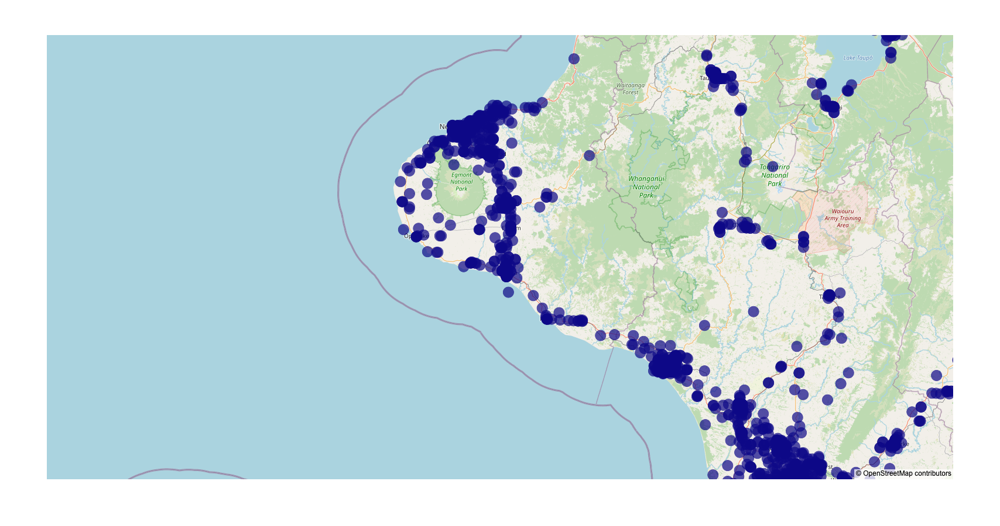

In [42]:
plotly.io.read_json(outputPath+"/loc_charts_ll_latitude_longitude")

In [43]:
# Example 2 - only passing 1 geohash column
generate_loc_charts_controller(df,"ifa",[], [], ["geohash"], max_records, global_map_box_val, outputPath)

For each geohash column, 1 Mapbox scatter plot will be generated and stored in JSON format:
- loc_charts_gh_geohash

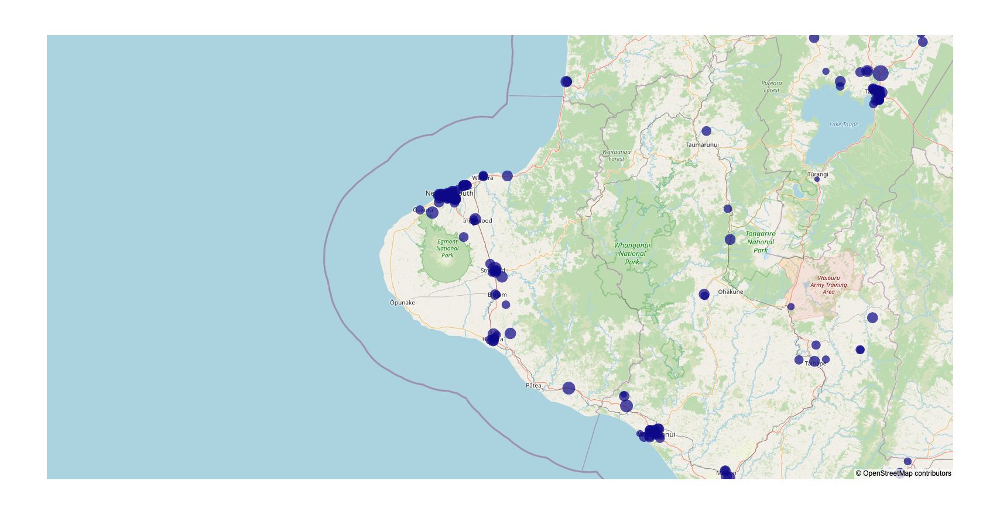

In [44]:
plotly.io.read_json(outputPath+"/loc_charts_gh_geohash")

In [45]:
# Example 3 - latitude, longitude, geohash columns are all specified
generate_loc_charts_controller(df,"ifa",["latitude"], ["longitude"], ["geohash"], max_records, global_map_box_val, outputPath)

(None, None)

If latitude, longitude, geohash columns are all specified, 1 figure for each lat-long pair and 1 figure for each geohash column will be generated and stored in JSON format.

In above cell, 2 figures will be stored in JSON format:
- loc_charts_ll_latitude_longitude
- loc_charts_gh_geohash

# Geospatial Autodetection

In [46]:
from anovos.data_analyzer.geospatial_analyzer import geospatial_autodetection

In [47]:
geospatial_autodetection(df, "ifa", outputPath, max_records, top_geo_records, max_cluster, 
                         eps, min_samples, global_map_box_val, run_type, auth_key)

(['latitude'], ['longitude'], ['geohash'])

`geospatial_autodetection` does not require prior knowledge about geospatial fields in the dataset. It will detect the geospatial columns automatically, and generate descriptive statstitics, cluster analysis and geospatial fields visualization for each geospatial field (lat-long pair and/or geohash) by calling the 3 functions mentioned above.